# Harpy, how to start

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import harpy as hp

the value of the environment variable BASIC_DCT_BACKEND is not in ["JAX","SCIPY"]


## 1. Read in the data

The first step of the Harpy pipeline includes reading in the raw data. This, minimally, includes the stained image(s) and the transcript locations.

The example dataset for this notebook will be downloaded and cached using `pooch` via `harpy.dataset.registry`.

For the input images, there are different options (see API documentation for more details)

- input the image as a dask or numpy array
- define the path to the location the image is stored at (preferably tiff or zarr)
- define a list of paths for different stainings (stored in different channels)
- define a pattern representing a collection of z-stacks. (these are currently by default max-projcted to form one image). 

The transcript location file is expected to be a txt or csv file. For RESOLVE, StereoSeq and Vizgen, specific dataloaders are created (still in progress for xenium and CosMx). For a new datatype, you can read the API on the function harpy.io.read_transcripts.

The image is then read in to a SpatialData object (see https://spatialdata.scverse.org/en/latest/ for more information). As the Spatial datasets are often larger-than memory, a path to where all data will be stored is asked. 


When working on GPU, it is advisable to define a client to avoid memory issues.  

In [3]:
from harpy.datasets.registry import get_registry
import tempfile

# change this path. It is the directory where the spatialdata .zarr will be saved.
OUTPUT_DIR =  tempfile.gettempdir()

registry=get_registry()
path_image = registry.fetch( "transcriptomics/resolve/mouse/20272_slide1_A1-1_DAPI.tiff" )
path_coordinates = registry.fetch("transcriptomics/resolve/mouse/20272_slide1_A1-1_results.txt")

crop_segment = True  # set to True to run tiling correction and segmentation step on a crop
if crop_segment:
    crop_param = [0, 6432, 0, 6432]  # x0,x1,y0,y1
else:
    crop_param = None

In [4]:
# if you stopped your analysis during the process and want to pick it up where you left it,
# you can read in your sdata object as follows:
# from spatialdata import read_zarr
# sdata_load=read_zarr( os.path.join(  OUTPUT_DIR, 'sdata_allocation.zarr' ) )

### Convert to zarr and load the image. 

In [5]:
import os
import uuid

img_layer = "raw_image"

# you can choose any name for your zarr file
zarr_path = os.path.join( OUTPUT_DIR, f"sdata_{uuid.uuid4()}.zarr")

sdata = hp.io.create_sdata(
    input=path_image,
    output_path=zarr_path,
    img_layer=img_layer,
    chunks=1024,
)

INFO     The Zarr backing store has been changed from None the new file path:                                      
         /Users/arnedf/VIB/DATA/logs/results_sparrow/notebook_runs/benchmark_notebook/sdata.zarr                   


2024-07-19 11:38:52,488 - harpy.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is ((c), (z), y, x)
2024-07-19 11:38:52,493 - harpy.image._manager - INFO - Writing results to layer 'raw_image'


In [6]:
sdata

SpatialData object, with associated Zarr store: /Users/arnedf/VIB/DATA/logs/results_sparrow/notebook_runs/benchmark_notebook/sdata.zarr
└── Images
      └── 'raw_image': DataArray[cyx] (1, 12864, 10720)
with coordinate systems:
    ▸ 'global', with elements:
        raw_image (Images)

### 1.1 Plot the image(s)

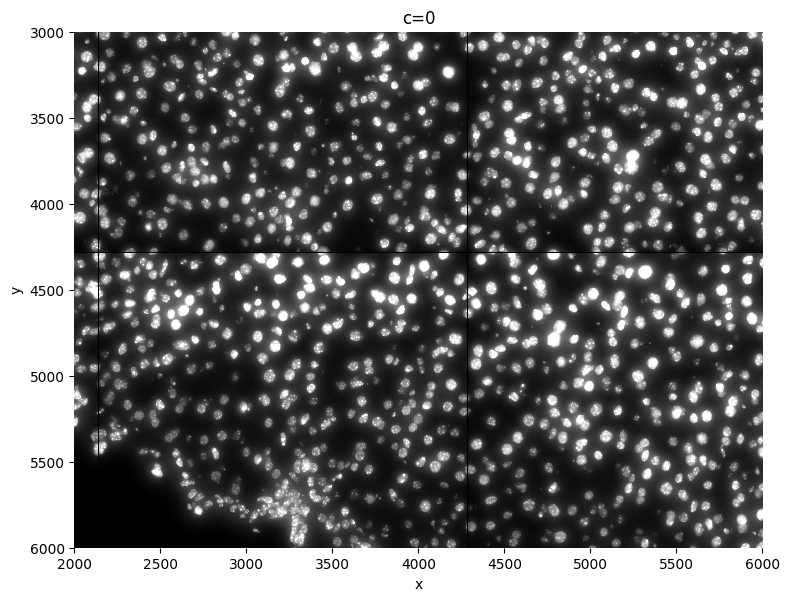

In [7]:
crd = [2000, 6000, 3000, 6000]  # crd used for visualization purposes

hp.pl.plot_image(sdata, img_layer="raw_image", crd=crd, figsize=(8, 8))

## 2. Processing the image(s)

### 2.1 tiling correction and inpainting

When working with RESOLVE data, the data is acquired in tiles, and the illumination within a tile isn't always constant. Sometimes one side of a tile is more illuminated than the other, influencing the downstream analysis greatly. RESOLVE assured us this isn't linked to the counts of the transcripts, but this can be checked further on.
In general this step is not necessary for other datatypes (you can check this by plotting the complete image). 

Basic is a tool that can correct for this, and is used in this function. The size of the tile needs to be known in order to run the function. The dfault value for this function is the tile size of RESOLVe (2144).

This step also corrects for black lines in between the tiles, by using inpainting. 

2024-07-19 11:39:07,548 - harpy.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is ((c), (z), y, x)
2024-07-19 11:39:07,552 - harpy.image._manager - INFO - Writing results to layer 'tiling_correction'


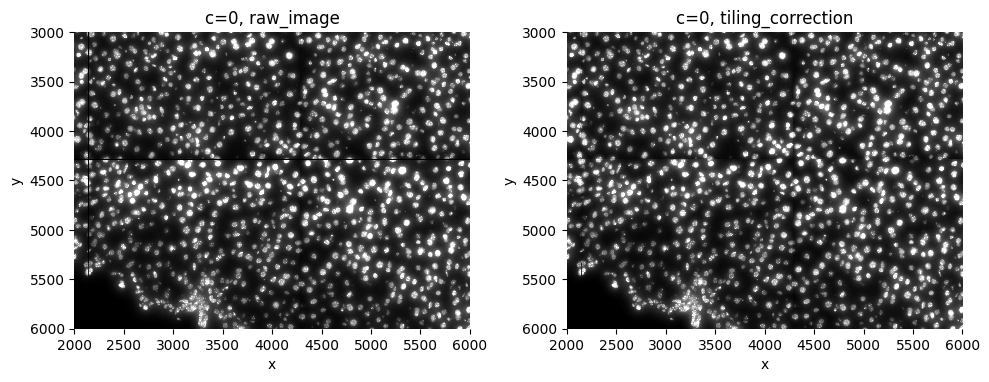

In [8]:
sdata, flatfields = hp.im.tiling_correction(
    sdata=sdata, img_layer="raw_image", crd=crop_param, output_layer="tiling_correction", overwrite=True
)

#hp.pl.flatfield(flatfields[0])
hp.pl.tiling_correction(
    sdata, crd=crd, img_layer=["raw_image", "tiling_correction"], figsize=(10, 10)
)

### 2.2 min-max filtering and contrast enhancing
The second step of the preprocessing the data includes a couple of steps:


- A min max filter can be added. The goal of this function is to substract background noise, and make the borders of the nuclei/cells cleaner, plus it will delete the occasional debris. If you take the size too small, smaller then the size of your nuclei, the function will create donuts, with black spots in the center of your cells.  If the size of the min max filter is chosen too big, not enough background is substracted, so a tradeoff should be made. This might need some finetuning. For nuclei in RESOLVE data, 45-55 is a great starting point. Bigger for whole cells. Adapt this parameter to make sure you delete debris and HALO's. 

- We recommend to perform contrast enhancing on your image. Harpy does this by using histogram equalization (CLAHE function). The amount of correction needed can be decided by adapting the contrast_clip value. If the image is already quite bright, 3.5 might be a good starting value. For dark images, you can go up to 10 or even more. Make sure at the end the whole image is evenly illuminated and no cells are dark in the background.

In every cleaning step, a new image is created and save to memory, hat is then used as an input for the next step. Note that it is currently not possible to overwrite these objects. You will have to define a new name every time you run the function, and thne in the end delete the images you don't need on disk. 
 
If you think you need more image processing, you can perform other steps using our apply function (see API? maybe not yet..) These images can then be added to the SpatialData object too

2024-07-19 11:39:08,172 - harpy.image._apply - INFO - 'combine_z' is False, but not all 'z-slices' spefified in 'fn_kwargs'/'func' ({'size_min_max_filter': 45}/<function min_max_filtering.<locals>._apply_min_max_filter at 0x10564b130>). Specifying z-slices ([0]).
2024-07-19 11:39:08,172 - harpy.image._apply - INFO - 'combine_c' is False, but not all channels spefified in 'fn_kwargs'/'func' ({0: {'size_min_max_filter': 45}}/{0: <function min_max_filtering.<locals>._apply_min_max_filter at 0x10564b130>}). Specifying channels ([0]).
2024-07-19 11:39:08,183 - harpy.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is ((c), (z), y, x)
2024-07-19 11:39:08,187 - harpy.image._manager - INFO - Writing results to layer 'min_max_filtered'


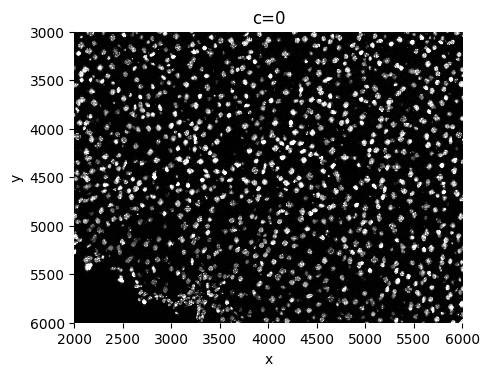

2024-07-19 11:39:09,991 - harpy.image._apply - INFO - 'combine_z' is False, but not all 'z-slices' spefified in 'fn_kwargs'/'func' ({'contrast_clip': 3.5}/<function enhance_contrast.<locals>._apply_clahe at 0x3d87f8940>). Specifying z-slices ([0]).
2024-07-19 11:39:09,992 - harpy.image._apply - INFO - 'combine_c' is False, but not all channels spefified in 'fn_kwargs'/'func' ({0: {'contrast_clip': 3.5}}/{0: <function enhance_contrast.<locals>._apply_clahe at 0x3d87f8940>}). Specifying channels ([0]).
2024-07-19 11:39:10,026 - harpy.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is ((c), (z), y, x)
2024-07-19 11:39:10,030 - harpy.image._manager - INFO - Writing results to layer 'clahe'


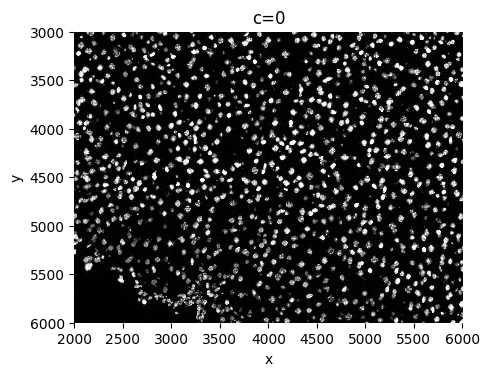

In [9]:
sdata = hp.im.min_max_filtering(
    sdata=sdata, img_layer="tiling_correction", output_layer="min_max_filtered", size_min_max_filter=45, overwrite=True
)
hp.pl.plot_image(sdata, img_layer="min_max_filtered", crd=crd, figsize=(5, 5))
sdata = hp.im.enhance_contrast(
    sdata=sdata, img_layer="min_max_filtered", output_layer="clahe", contrast_clip=3.5, chunks=20000, overwrite=True
)
hp.pl.plot_image(sdata, img_layer="clahe", crd=crd, figsize=(5, 5))

## 3. Segmenting the image

For the segmentation, we here show an example on how to use cellpose, a deep learning network based on a UNET architecture. This is a great tool , because it segments both nuclei and whole cells. 

Multiple paramters need to be given as an input to the cellpose algorithm. We recommend tuning for the optimal segmentation quality. 
 
- diameter: Includes an estimate of the diameter of a nucleus. If put to none, cellpose will do the estimation by himself, but this estimation might take longer than the actual segmentation, and if often far off. Estimate around 7 micrometer (in this case 50 pixels at 0.138 micrometer per pixel) for a standard nucleus, and more for whole cells. Input is in pixels.This of course is tissue and method dependent. You can run the algorthim on a small piece (I[0:1000,0:1000] for example), to get an estimate of the size. However, this estimate isn't always accurate. So check the quality at the end. If you see all nuclei/cells are estimated too small, enlarge this parameter.
- device: Defines the device you want to work on, if you only have cpu, you can skip this input parameter. If only having CPU, please tune the parameters on a small subset, and then make it to the big one. This might take a while for large images, but it should work. 
- flow_threshold: Indicates something about the shape of the masks, if you increase it, more masks with less round shapes will be accepted. Up to one:  I take it between 0.6 and 0.95, depending on the cell shapes. Higher is less round. Lower it if you start segmenting artefacts, up it if you miss non-round shaped cells.
- mask_threshold: Indicates how many of the possible masks are kept. Making it smaller (up to -6), will give you more masks, bigger is less masks. I take it between 0 and -6. Be careful, you can oversegment: always check the quality 
- min_size: Indicates the minimal size of a nucleus. 
- If segmenting whole cells instead of nuclei, set the parameter model_type to 'cyto'.
- If using nuclei together with whole cells, put model_type to 'cyto', make sure your image is 3D and and that the first channel is you complete cell staining and you second one is the nucleus channel, put the parameter channel to np.array([1,0])

2024-07-19 11:40:37,520 - harpy.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is ((c), (z), y, x)
2024-07-19 11:40:37,525 - harpy.image._manager - INFO - Writing results to layer 'segmentation_mask'


/Users/arnedf/miniconda3/envs/harpy/lib/python3.10/site-packages/rasterio/features.py:126: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  for s, v in _shapes(source, mask, connectivity, transform):
2024-07-19 11:40:42,225 - harpy.image.segmentation._apply - WARNING - Chunks are not relabeled. Please make sure that provided Callable <function _expand_cells at 0x3517f3f40> returns unique labels across chunks, otherwise collisions can be expected.
2024-07-19 11:40:42,580 - harpy.image.segmentation._apply - WARNING - Chunks are not relabeled. Please make sure that provided Callable <function _expand_cells at 0x3517f3f40> returns unique labels across chunks, otherwise collisions can be expected.
2024-07-19 11:40:42,618 - harpy.image.segmentation._apply - WARNING - Chunks are not relabeled. Please make sure that provided Callable <function _expand_cells at 0x3517f3f40> returns unique labels across chunks, otherwise collisions can 

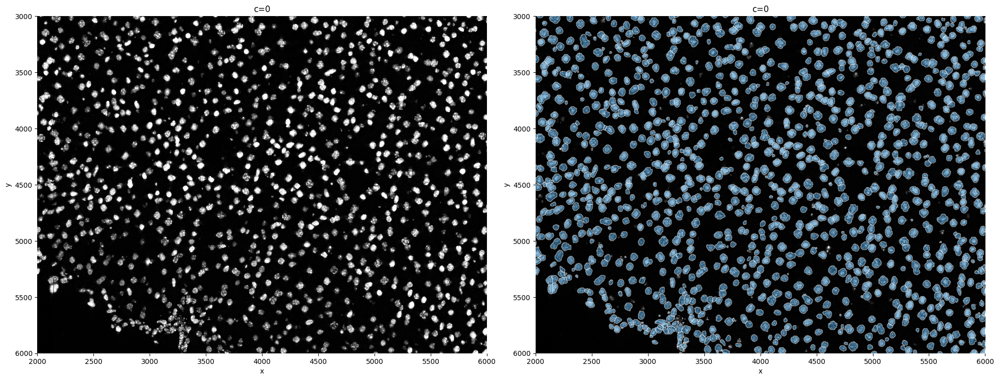

In [10]:
sdata = hp.im.segment(
    sdata=sdata,
    img_layer="clahe",
    output_labels_layer="segmentation_mask",
    output_shapes_layer="segmentation_mask_boundaries",
    crd=crop_param,
    device="cpu",
    min_size=80,
    flow_threshold=0.9,
    diameter=50,
    cellprob_threshold=-4,
    model_type="nuclei",
    chunks=2048,
    depth=(2 * 50, 2 * 50),
    overwrite=True,
)

hp.pl.segment(sdata=sdata, crd=crd, img_layer="clahe", shapes_layer="segmentation_mask_boundaries")

This is in general not recommended, but it is possible to expand cells beyond the segmented bodies.

2024-07-19 11:40:41,638 - harpy.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is ((c), (z), y, x)
2024-07-19 11:40:41,641 - harpy.image._manager - INFO - Writing results to layer 'segmentation_mask_expanded'


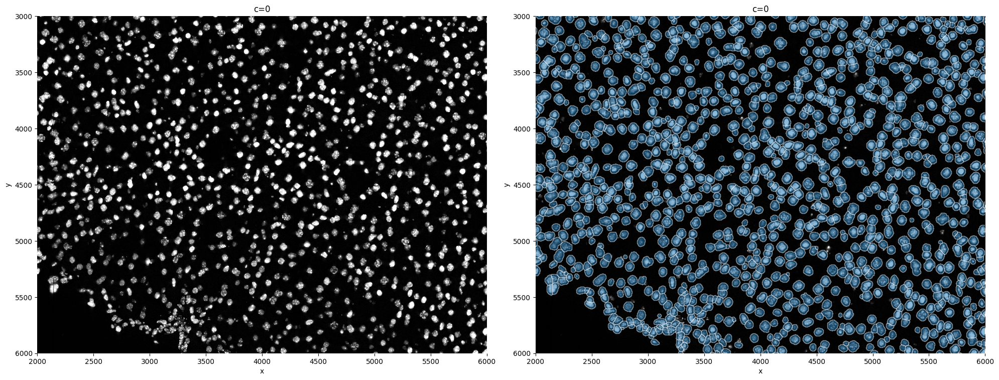

In [11]:
expand_masks = True
if expand_masks:
    sdata = hp.im.expand_labels_layer(
        sdata,
        labels_layer="segmentation_mask",
        distance=10,
        output_labels_layer="segmentation_mask_expanded",
        output_shapes_layer="segmentation_mask_expanded_boundaries",
        overwrite=True,
    )
    hp.pl.segment(sdata=sdata, crd=crd, img_layer="clahe", shapes_layer="segmentation_mask_expanded_boundaries")

## 4. Allocating  the transcripts

###  4.1 Creating the count matrix
In this step we
- load in the transcipts: in the case of RESOLVE this is done with a specific loader. If no specific loader exist for your datatype, you can use the general `harpy.io.read_transcripts` function.
- allocate the transcripts to the correct cell. This allocation step creates the count matrix, saved in an anndata object that is reachable by typing sdata.table
- Visual checks

In [12]:
sdata = hp.io.read_resolve_transcripts(sdata, output_layer="transcripts", path_count_matrix=path_coordinates, overwrite=True)

sdata = hp.tb.allocate(
    sdata=sdata,
    labels_layer="segmentation_mask",
    points_layer="transcripts",
    output_layer="table_transcriptomics",
    overwrite=True,
)

2024-07-19 11:40:46,722 - harpy.io._transcripts - INFO - No transform matrix given, will use identity matrix.
2024-07-19 11:40:46,722 - harpy.io._transcripts - INFO - Transform matrix used:
 [[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
2024-07-19 11:40:48,001 - harpy.table._allocation - INFO - Calculating cell counts.
2024-07-19 11:40:48,774 - harpy.shape._manager - INFO - Filtering 14 cells from shapes layer 'segmentation_mask_boundaries'. Adding new shapes layer 'filtered_segmentation_segmentation_mask_boundaries' containing these filtered out polygons.
2024-07-19 11:40:49,155 - harpy.utils._io - WARNING - layer with name 'segmentation_mask_boundaries' already exists. Overwriting...
2024-07-19 11:40:49,559 - harpy.shape._manager - INFO - Filtering 14 cells from shapes layer 'segmentation_mask_expanded_boundaries'. Adding new shapes layer 'filtered_segmentation_segmentation_mask_expanded_boundaries' containing these filtered out polygons.
2024-07-19 11:40:49,932 - harpy.utils._io - WARNING - 

This next plot can be used to check counts on specific cells

In [13]:
# some sanity checks
# some sanity checks
matching_indexes = [
    index for index in sdata.tables["table_transcriptomics"].to_df().index if index.startswith("34_segmentation_mask")
]
random_cell = matching_indexes[0]
random_gene = "Ghr"

sdata.tables["table_transcriptomics"][random_cell, random_gene].to_df()

,Ghr
cells,
34_segmentation_mask_7b552d63,4


plot transcripts matrix for cell 34_segmentation_mask_7b552d63 and gene Ghr


2024-07-19 11:40:50,518 - harpy.plot._sanity - INFO - Plotting 35 transcripts.
2024-07-19 11:40:50,520 - harpy.plot._sanity - INFO - Selecting boundaries
2024-07-19 11:40:50,581 - harpy.plot._sanity - INFO - Plotting boundaries
2024-07-19 11:40:50,608 - harpy.plot._sanity - INFO - End plotting boundaries


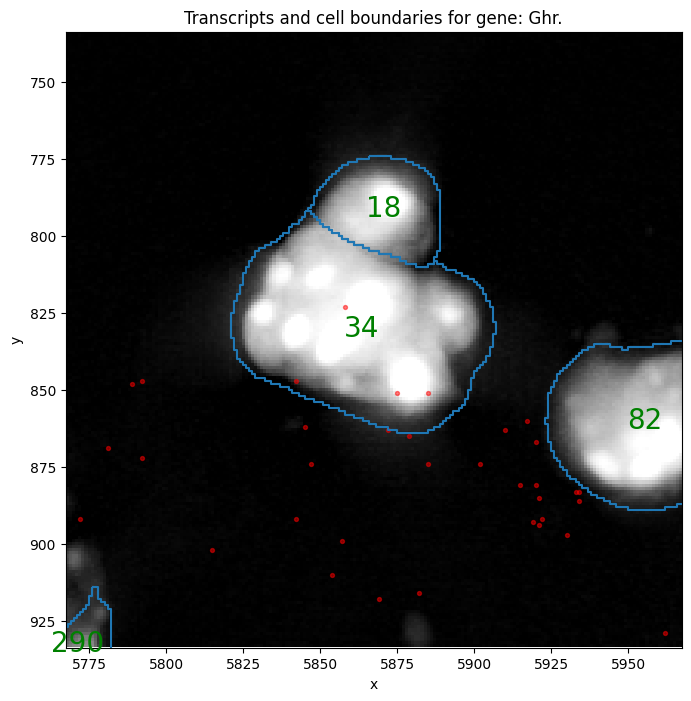

In [14]:
diameter = 50

if random_cell is not None and random_gene is not None:
    cell_center = sdata.tables["table_transcriptomics"].obsm["spatial"][
        sdata.tables["table_transcriptomics"].to_df().index.get_loc(str(random_cell))
    ]
    crd_sanity = [
        cell_center[0] - (diameter + 50),
        cell_center[0] + (diameter + 50),
        cell_center[1] - (diameter + 50),
        cell_center[1] + (diameter + 50),
    ]

    print(f"plot transcripts matrix for cell {random_cell} and gene {random_gene}")

    hp.pl.sanity(
        sdata=sdata,
        img_layer="clahe",
        points_layer="transcripts",
        shapes_layer="segmentation_mask_boundaries",
        crd=crd_sanity,
        plot_cell_number=True,
        gene=random_gene,
        figsize=(8,8),
    )

In this step, there might be semgented entities that do not contain any transcripts. These entities are filtered out of the semgentation_mask_boundaries shapes layer and aren't added to the anndata. Instead these shapes are now saved in filtered_semgentation_segmentation_mask_boundaries.

It is possible to visualize these entities on the image with red borders, by making use of the shapes_layer_filtered parameter. As you can see, in this case, only 17 entities were filtered. This will be very dataset dependent. When there are regions with necrosis for example, this number will be way higher. 

Visualizing these cells shows clearly on plots that those cells weren't missed with segmentation, but were missed becasue of no transcripts measured, an issue?

In [15]:
sdata

SpatialData object, with associated Zarr store: /Users/arnedf/VIB/DATA/logs/results_sparrow/notebook_runs/benchmark_notebook/sdata.zarr
├── Images
│     ├── 'clahe': DataArray[cyx] (1, 6432, 6432)
│     ├── 'min_max_filtered': DataArray[cyx] (1, 6432, 6432)
│     ├── 'raw_image': DataArray[cyx] (1, 12864, 10720)
│     └── 'tiling_correction': DataArray[cyx] (1, 6432, 6432)
├── Labels
│     ├── 'segmentation_mask': DataArray[yx] (6432, 6432)
│     └── 'segmentation_mask_expanded': DataArray[yx] (6432, 6432)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 3) (2D points)
├── Shapes
│     ├── 'filtered_segmentation_segmentation_mask_boundaries': GeoDataFrame shape: (14, 1) (2D shapes)
│     ├── 'filtered_segmentation_segmentation_mask_expanded_boundaries': GeoDataFrame shape: (14, 1) (2D shapes)
│     ├── 'segmentation_mask_boundaries': GeoDataFrame shape: (3364, 1) (2D shapes)
│     └── 'segmentation_mask_expanded_boundaries': GeoDataFrame shape: (3364, 1) (2D shapes

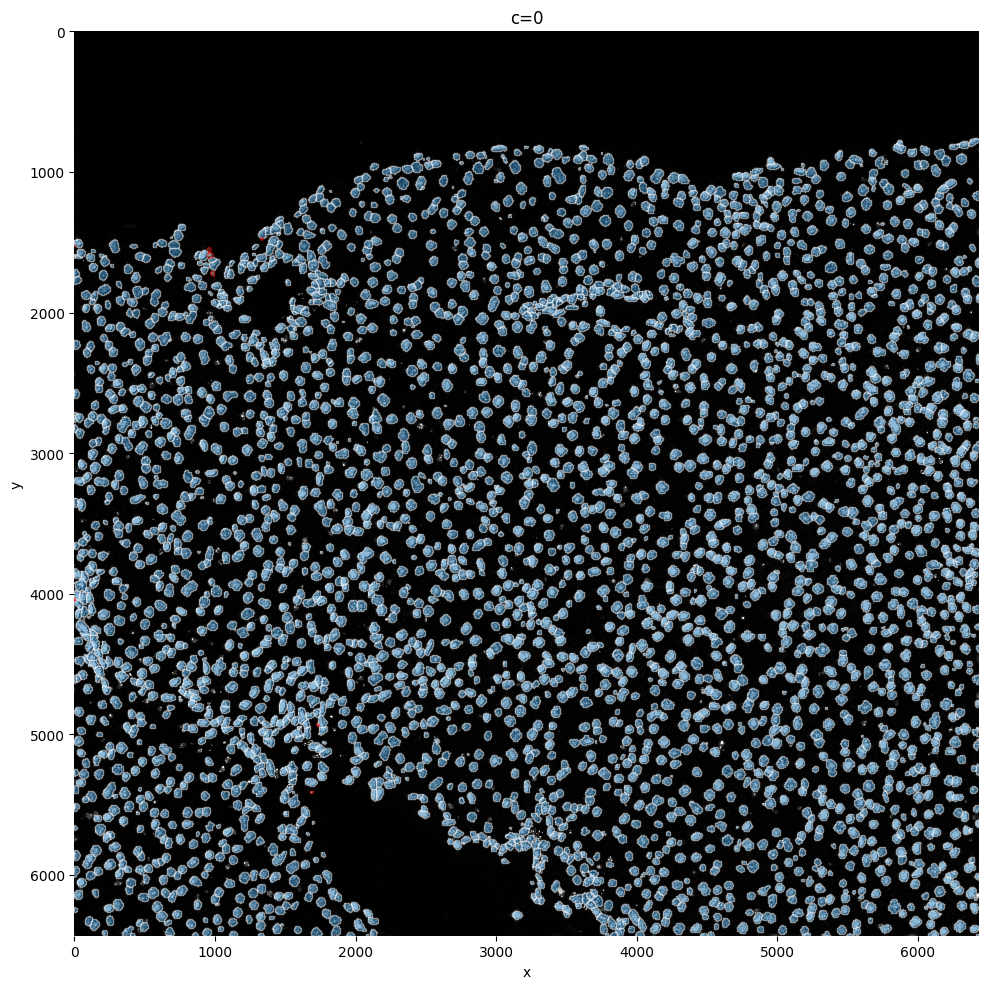

In [16]:
hp.pl.plot_shapes(
    sdata,
    img_layer="clahe",
    shapes_layer="segmentation_mask_boundaries",
    shapes_layer_filtered="filtered_segmentation_segmentation_mask_boundaries",
)

###  4.2 Transcript quality plot
After we have created the anndata object, we control the transcript quality. 

First we create a plot to chekc if the transcript density is similar across the whole tissue. If this isn't the case, it can have multiple reasons. Most likely, there will be regions in which the transcript pick-up was less succesfull. Also gene panel choices can influence this plot. 



2024-07-19 11:40:52,553 - harpy.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is ((c), (z), y, x)
2024-07-19 11:40:52,558 - harpy.image._manager - INFO - Writing results to layer 'transcript_density'


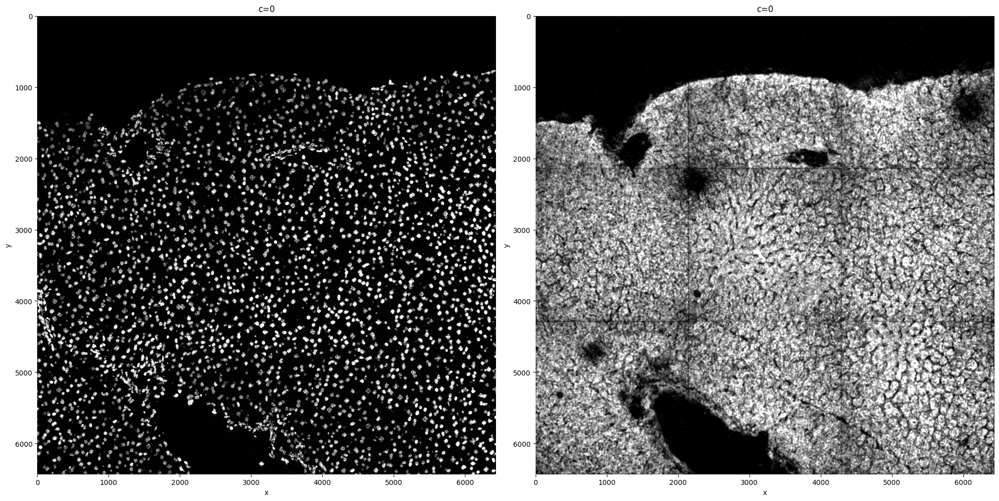

In [17]:
sdata = hp.im.transcript_density(
    sdata,
    img_layer="clahe",
    points_layer="transcripts",
    output_layer="transcript_density",
    overwrite=True,
)
hp.pl.transcript_density(sdata, img_layer=["clahe", "transcript_density"])

As not all of the image surface is segmented, there will be most likely transcripts that weren't assigned to a cell. 
For sure in the case of nucleus segmentation (like this example), this will be the case.

In general, we hope to not lose any genes. So we hope there aren't genes with low abundances and a low proportion kept. In general we see a downward trend. The more a gene is measured, the less it is located in cells (in ratio).

We also provide a table with the genes that are the least located in cells. If a lot of these genes arem akrers for the same celltype, the staining might bem issing this celltype and you should for sure check this. However, it might also be the case that is celltype just has a lot of cytoplasm and you are only semgenting the nucleus.

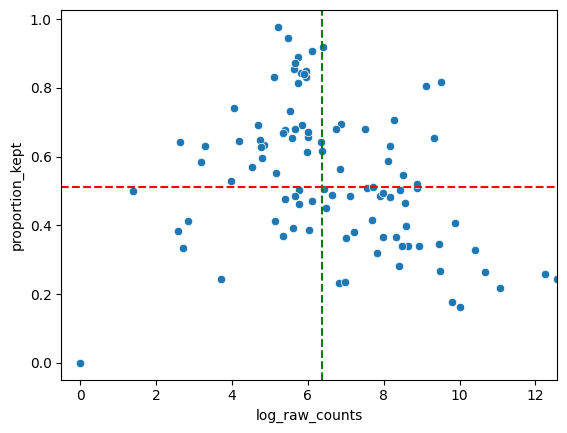

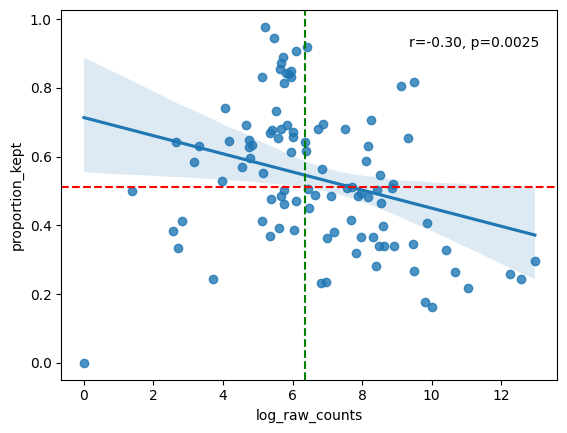

2024-07-19 11:40:55,605 - harpy.plot._transcripts - INFO - The ten genes with the highest proportion of transcripts filtered out in the region of interest ([x_min,x_max,y_min,y_max]=(0, 6432, 0, 6432)):
          proportion_kept  raw_counts
Ms4a7            0.000000           1
Gls2             0.162150       21992
Glul             0.177062       18197
Ghr              0.217128       63345
Atp6v0d2         0.231023         909
Des              0.235183        1063
Cyp2e1           0.242895      289182
Folr2            0.243902          41
Fn1              0.258162      210546
Hal              0.263655       43428


In [18]:
filtered = hp.pl.analyse_genes_left_out(
    sdata,
    labels_layer="segmentation_mask",
    table_layer="table_transcriptomics",
    points_layer="transcripts",
)

## 5. Preprocess adata 

### 5.1 Filtering and Normalization

The anndata object is now processed:

- calculate QC metrics
- filter cells with less then 10 gene counts and genes with less then 5 cells (adaptations possible by adapting the function). These filtered cells are again filtered out of the shapes layer and the anndata obejct and saved in an extra shapes layer.
- Normalization: For small gene panel (<500), we recommend to normalize the data based on the size of the segmented object (size_norm=True). For transcriptome-wide methods, we recommend standard library size normalization (size_norm=False). 


The last plot shows the size of the nucleus related to the counts. When working with whole cells, if there are some really big xcells with really low counts, they are probably not real cells and you should filter based on max size. 

In [19]:
sdata

SpatialData object, with associated Zarr store: /Users/arnedf/VIB/DATA/logs/results_sparrow/notebook_runs/benchmark_notebook/sdata.zarr
├── Images
│     ├── 'clahe': DataArray[cyx] (1, 6432, 6432)
│     ├── 'min_max_filtered': DataArray[cyx] (1, 6432, 6432)
│     ├── 'raw_image': DataArray[cyx] (1, 12864, 10720)
│     ├── 'tiling_correction': DataArray[cyx] (1, 6432, 6432)
│     └── 'transcript_density': DataArray[cyx] (1, 6432, 6432)
├── Labels
│     ├── 'segmentation_mask': DataArray[yx] (6432, 6432)
│     └── 'segmentation_mask_expanded': DataArray[yx] (6432, 6432)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 3) (2D points)
├── Shapes
│     ├── 'filtered_segmentation_segmentation_mask_boundaries': GeoDataFrame shape: (14, 1) (2D shapes)
│     ├── 'filtered_segmentation_segmentation_mask_expanded_boundaries': GeoDataFrame shape: (14, 1) (2D shapes)
│     ├── 'segmentation_mask_boundaries': GeoDataFrame shape: (3364, 1) (2D shapes)
│     └── 'segmentation_mask

In [20]:
# Perform preprocessing.
sdata = hp.tb.preprocess_transcriptomics(
    sdata,
    labels_layer="segmentation_mask",
    table_layer="table_transcriptomics",
    output_layer="table_transcriptomics_preprocessed",  # write results to a new slot, we could also write to the same slot (when passing overwrite==True).
    min_counts=10,
    min_cells=5,
    size_norm=True,
    n_comps=50,
    overwrite=True,
)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
2024-07-19 11:40:55,763 - harpy.table._preprocess - INFO - Calculating cell size from provided labels_layer 'segmentation_mask'
2024-07-19 11:40:56,469 - harpy.shape._manager - INFO - Filtering 99 cells from shapes layer 'segmentation_mask_boundaries'. Adding new shapes layer 'filtered_low_counts_segmentation_mask_boundaries' containing these filtered out polygons.
2024-07-19 11:40:57,184 - harpy.utils._io - WARNING - layer with name 'segmentation_mask_boundaries' already exists. Overwriting...
2024-07-19 11:40:57,560 - harpy.shape._manager - INFO - Filtering 99 cells from shapes layer 'segmentation_mask_expanded_boundaries'. Adding new shapes layer 'filtered_low_counts_segmentation_mask_expanded_boundaries' containing these filtered out polygons.
2024-07-19 11:40:58,105 - harpy.utils._io - WARNING - layer with name 'segmentation_mask_expanded_boundaries' already exists. Overwriting...


the raw counts are saved in `sdata.tables['table_transcriptomics_preprocessed'].layers['raw_counts']`. The size normalized data in .raw.

In [21]:
sdata.tables[ "table_transcriptomics_preprocessed" ].raw.to_adata().to_df()

,Acta2,Adamtsl2,Adgre1,Adgrg6,Atp6v0d2,Axl,C5ar1,Ccr2,Ccr7,Cd14,...,Svep1,Timd4,Tmem119,Trem2,Vsig4,Vwf,Wnt2,Wnt9b,Wt1,Xcr1
cells,,,,,,,,,,,,,,,,,,,,,
17_segmentation_mask_7b552d63,0.0,0.027087,0.000000,0.0,0.0,0.027087,0.000000,0.000000,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.053460,0.0
18_segmentation_mask_7b552d63,0.0,0.000000,0.438225,0.0,0.0,0.168322,0.087699,0.000000,0.0,0.0,...,0.000000,0.0,0.242928,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0
33_segmentation_mask_7b552d63,0.0,0.333588,0.000000,0.0,0.0,0.035364,0.000000,0.000000,0.0,0.0,...,0.000000,0.0,0.134521,0.000000,0.000000,0.0,0.0,0.0,0.134521,0.0
34_segmentation_mask_7b552d63,0.0,0.158128,0.024179,0.0,0.0,0.115442,0.000000,0.000000,0.0,0.0,...,0.070851,0.0,0.047787,0.000000,0.000000,0.0,0.0,0.0,0.070851,0.0
35_segmentation_mask_7b552d63,0.0,0.000000,0.168807,0.0,0.0,0.137248,0.036118,0.036118,0.0,0.0,...,0.000000,0.0,0.137248,0.104661,0.000000,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7880_segmentation_mask_7b552d63,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.033730,0.0,0.0,0.0,0.000000,0.0
7892_segmentation_mask_7b552d63,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0
7896_segmentation_mask_7b552d63,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0


In [22]:
sdata.tables[ "table_transcriptomics_preprocessed" ].layers[ "raw_counts" ]

<Compressed Sparse Row sparse matrix of dtype 'uint32'
	with 44325 stored elements and shape (3265, 98)>

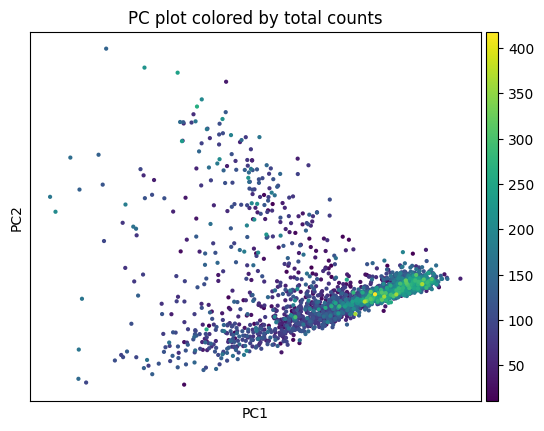

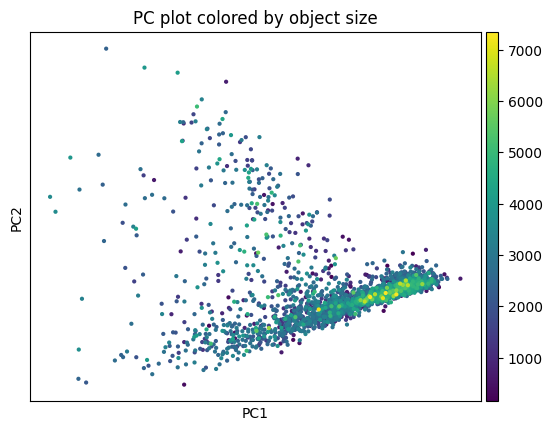

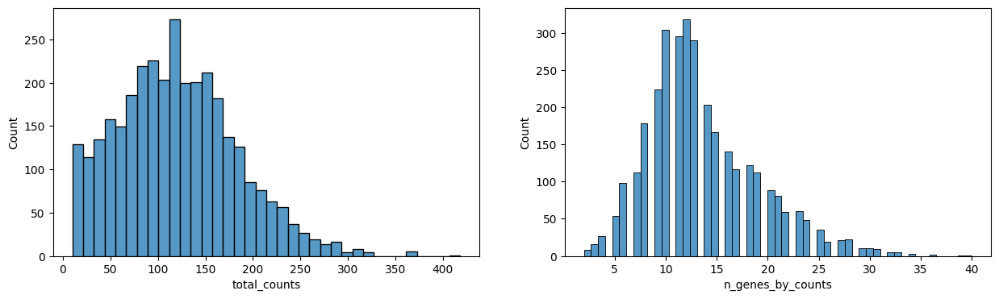

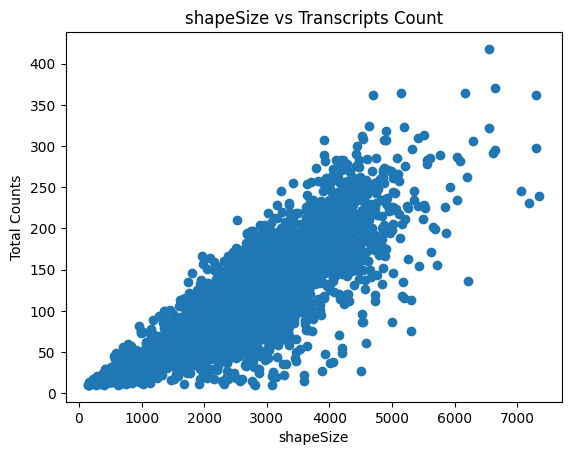

In [23]:
hp.pl.preprocess_transcriptomics(
    sdata,
    table_layer="table_transcriptomics_preprocessed",
)

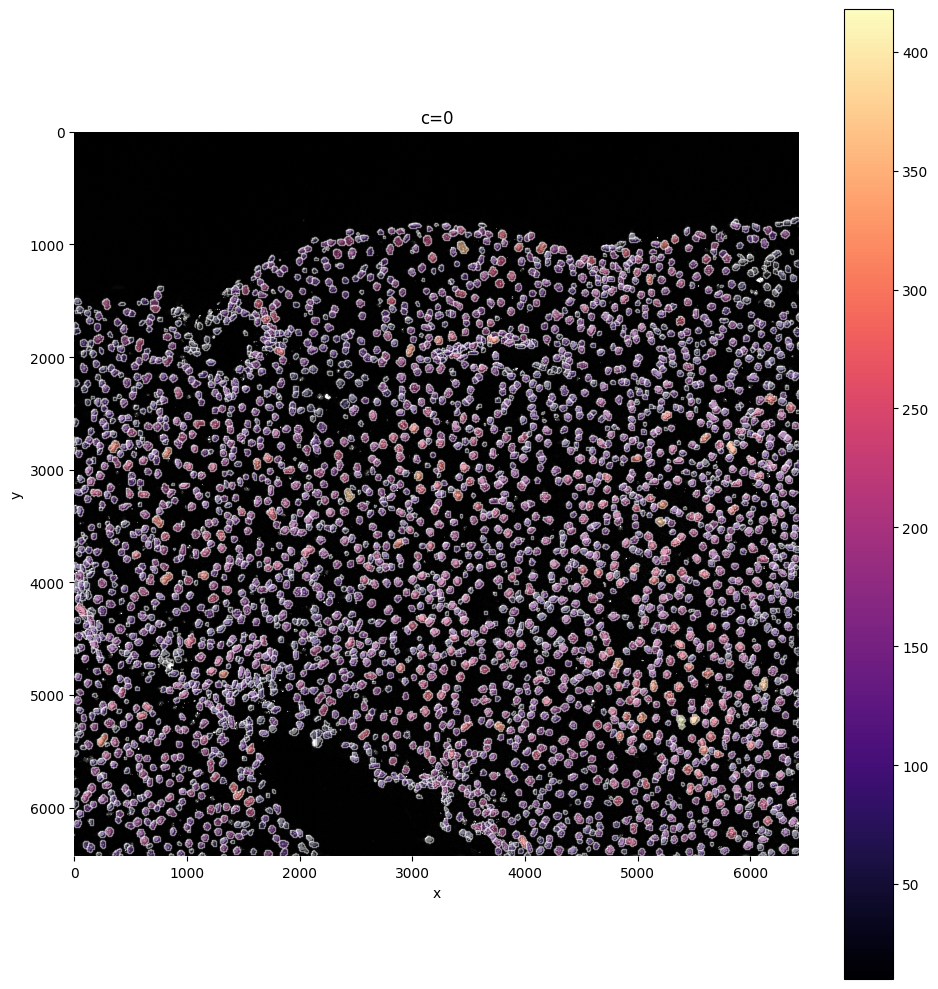

In [24]:
hp.pl.plot_shapes(
    sdata,
    img_layer="clahe",
    table_layer="table_transcriptomics_preprocessed",
    column="total_counts",
    shapes_layer="segmentation_mask_boundaries",
)

In this step you can filter cells based on their size: are you sure cells need to be bigger, or sure your cells can not be larger than X? 

You can delete them with this function by defining min_size and max_size. 

2024-07-19 11:41:00,965 - harpy.shape._manager - INFO - Filtering 74 cells from shapes layer 'segmentation_mask_boundaries'. Adding new shapes layer 'filtered_size_segmentation_mask_boundaries' containing these filtered out polygons.
2024-07-19 11:41:01,670 - harpy.utils._io - WARNING - layer with name 'segmentation_mask_boundaries' already exists. Overwriting...
2024-07-19 11:41:02,182 - harpy.shape._manager - INFO - Filtering 74 cells from shapes layer 'segmentation_mask_expanded_boundaries'. Adding new shapes layer 'filtered_size_segmentation_mask_expanded_boundaries' containing these filtered out polygons.
2024-07-19 11:41:02,890 - harpy.utils._io - WARNING - layer with name 'segmentation_mask_expanded_boundaries' already exists. Overwriting...
2024-07-19 11:41:03,339 - harpy.table._table - INFO - 74 cells were filtered out based on size.


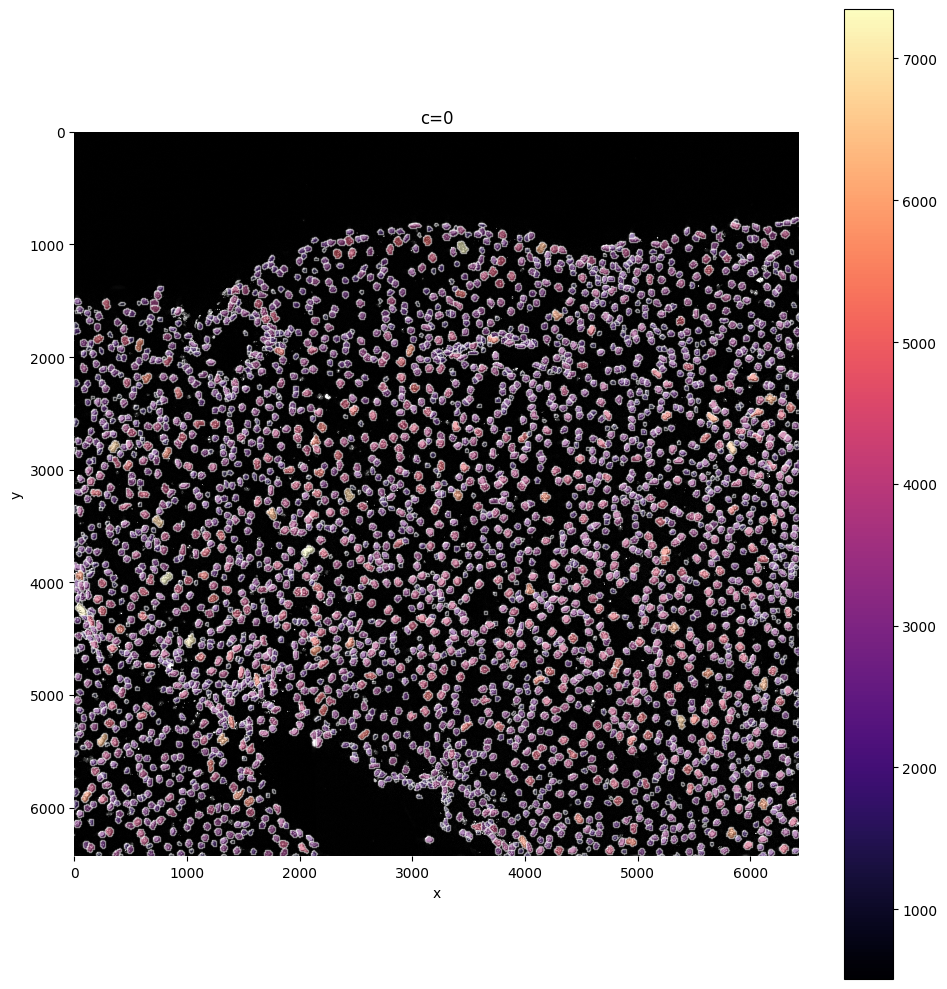

In [25]:
sdata = hp.tb.filter_on_size(
    sdata,
    labels_layer="segmentation_mask",
    table_layer="table_transcriptomics_preprocessed",
    output_layer="table_transcriptomics_filter",
    min_size=500,
    max_size=100000,
    overwrite=True,
)

hp.pl.plot_shapes(
    sdata,
    img_layer="clahe",
    table_layer="table_transcriptomics_filter",
    column="shapeSize",
    shapes_layer="segmentation_mask_boundaries",
)

You can see all filtered layers present in your sdata object under shapes

In [26]:
sdata

SpatialData object, with associated Zarr store: /Users/arnedf/VIB/DATA/logs/results_sparrow/notebook_runs/benchmark_notebook/sdata.zarr
├── Images
│     ├── 'clahe': DataArray[cyx] (1, 6432, 6432)
│     ├── 'min_max_filtered': DataArray[cyx] (1, 6432, 6432)
│     ├── 'raw_image': DataArray[cyx] (1, 12864, 10720)
│     ├── 'tiling_correction': DataArray[cyx] (1, 6432, 6432)
│     └── 'transcript_density': DataArray[cyx] (1, 6432, 6432)
├── Labels
│     ├── 'segmentation_mask': DataArray[yx] (6432, 6432)
│     └── 'segmentation_mask_expanded': DataArray[yx] (6432, 6432)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 3) (2D points)
├── Shapes
│     ├── 'filtered_low_counts_segmentation_mask_boundaries': GeoDataFrame shape: (99, 1) (2D shapes)
│     ├── 'filtered_low_counts_segmentation_mask_expanded_boundaries': GeoDataFrame shape: (99, 1) (2D shapes)
│     ├── 'filtered_segmentation_segmentation_mask_boundaries': GeoDataFrame shape: (14, 1) (2D shapes)
│     ├── 'f

### 5.2 Clustering

This function performs the neighborhood analysis and the leiden clustering and the UMAP calculations using standar scanpy functions.

You need to define 2 parameters:
- the amount of PC's used: I normally choose something between 15-20 based on the plot of PC's.
- The amount of neighbors used: Normally I go for 35. Less neighbors means more spread, more means everything tighter, in general.

It returns the UMAP and marker gene list per cluster, that can be looked at for finding celltypes. 

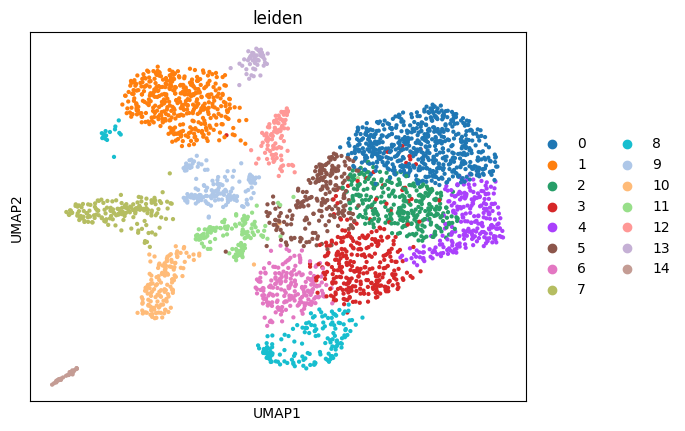

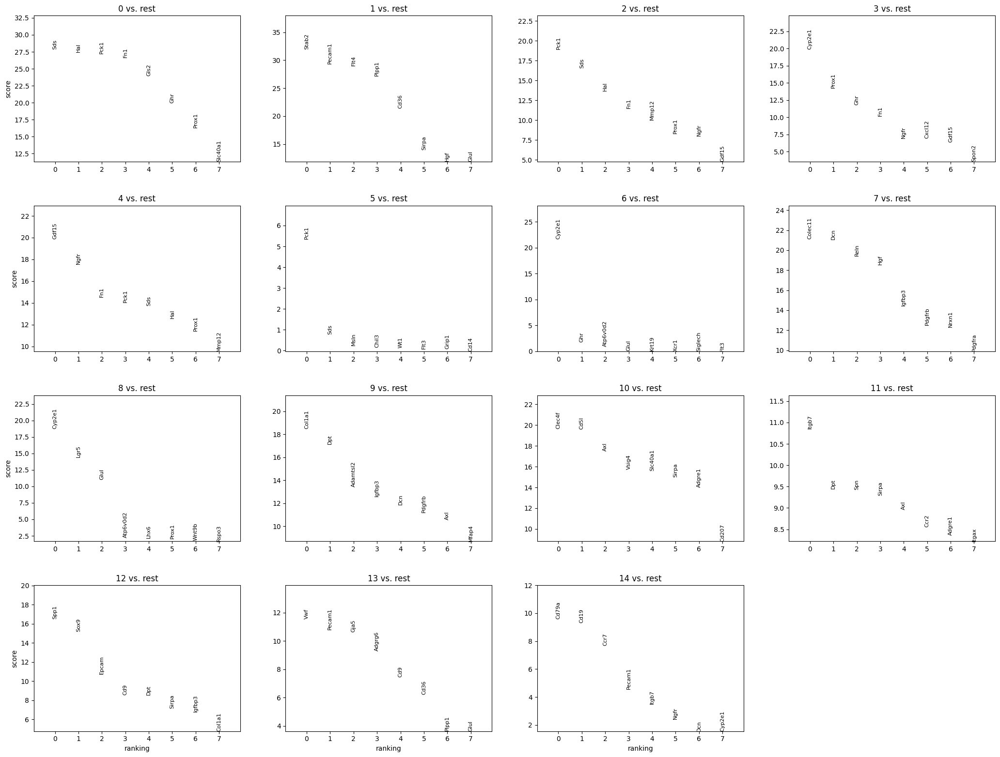

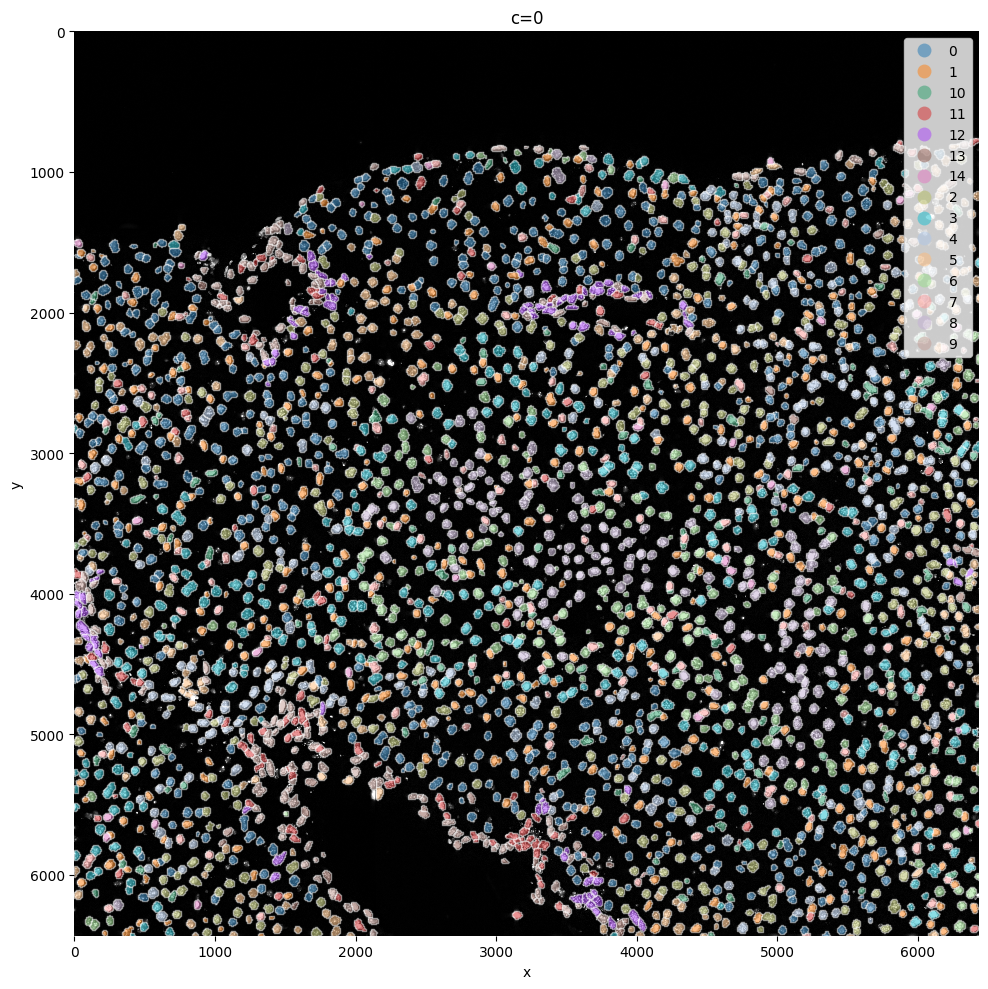

In [27]:
sdata = hp.tb.leiden(
    sdata,
    labels_layer="segmentation_mask",
    table_layer="table_transcriptomics_filter",
    output_layer="table_transcriptomics_clustered",
    calculate_umap=True,
    calculate_neighbors=True,
    n_pcs=17,
    n_neighbors=35,
    resolution=0.8,
    rank_genes=True,
    key_added="leiden",
    overwrite=True,
)

hp.pl.cluster(
    sdata,
    table_layer="table_transcriptomics_clustered",
    key_added="leiden",
)

hp.pl.plot_shapes(
    sdata,
    img_layer="clahe",
    table_layer="table_transcriptomics_clustered",
    column="leiden",
    shapes_layer="segmentation_mask_boundaries",
)

Here we reuse the plot_shapes function to actually plot a subfigure of our image with the cells colored based on the clustering.

## 6. Annotating the cells 

Afte we created the count matrix, we are going to annotate the cells. Harpy has its own annotation algorithm, that starts fro m a marker gene list. 
It is an enrichment score algorithm, that compares the expression of marker genes in cells with a celltype weighted average. For this reason, the annotation happens iteratively. 

The input marker gene list should be a csv file, with the marker genes in the rows and the celltypes in the columns. The weight given to a celltype/ marker gene combination should reflect the marker gene specifity of the gene to the celltype.
binary inputs (zero for no marker, 1 for marker) are also accepted. 
A tutorial on how to create such marker genes lists from an atlas will follow. 

A cell is annotated to be unknown if its score is lower than zero for all celltypes. 

As the approach is iterative, the results of every step are shown. 



2024-07-19 11:41:19,933 - harpy.table._annotation - INFO - Scaling based on number of markers per celltype.
2024-07-19 11:41:20,019 - harpy.table._annotation - INFO - annotation
HepatocytesPortal               30.523347
HepatocytesCentral              12.629270
LECs                            10.937010
LSEC Central                    10.654967
Kupffer cells                    4.042620
stellate PeriPortal              3.791915
unknown_celltype                 3.133814
Neutrophils                      3.071138
Cholangiocytes                   3.008461
portal_vein_EC45                 2.319022
FibroblastsCentral               1.942965
T cells                          1.472893
VSMC                             1.316202
stellate PeriCentral             1.316202
B cells                          1.190849
cDC1s                            1.034159
ILC1s                            1.002820
Mesothelial cells                0.908806
Monocytes                        0.783453
LSEC45                  

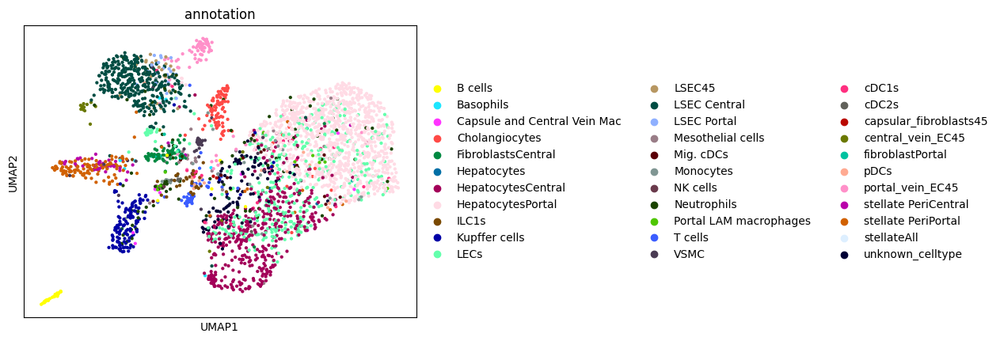

2024-07-19 11:41:20,236 - harpy.table._annotation - INFO - Iteration 0.
2024-07-19 11:41:20,321 - harpy.table._annotation - INFO - Scaling based on number of markers per celltype.
2024-07-19 11:41:20,408 - harpy.table._annotation - INFO - Percentage of cells with changed annotation: 14.73


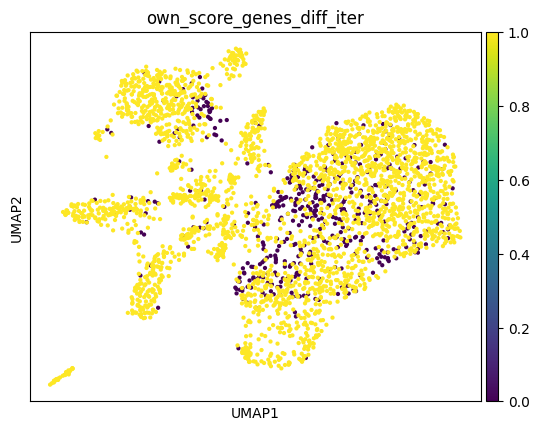

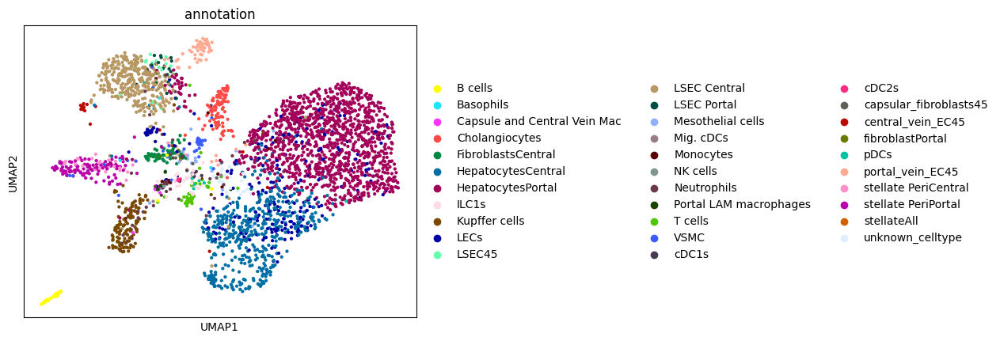

2024-07-19 11:41:20,679 - harpy.table._annotation - INFO - annotation
HepatocytesPortal               39.486055
HepatocytesCentral              15.230335
LSEC Central                    10.247571
LECs                             7.646506
Kupffer cells                    3.823253
stellate PeriPortal              3.509872
Cholangiocytes                   2.883109
portal_vein_EC45                 2.068317
Neutrophils                      1.817612
FibroblastsCentral               1.692259
T cells                          1.410216
VSMC                             1.316202
stellate PeriCentral             1.190849
B cells                          1.128173
unknown_celltype                 1.034159
ILC1s                            0.846130
Mesothelial cells                0.752115
LSEC Portal                      0.658101
LSEC45                           0.564086
central_vein_EC45                0.564086
Monocytes                        0.438734
cDC1s                            0.313381
fibrob

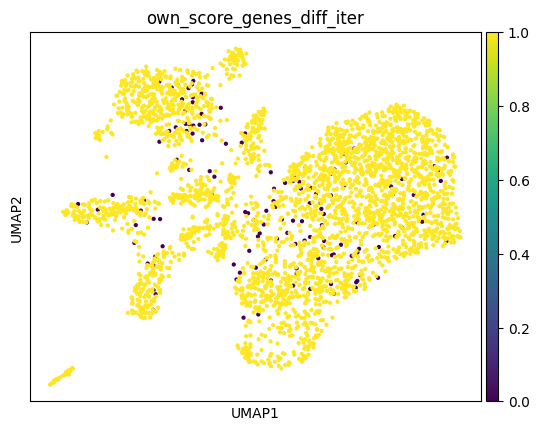

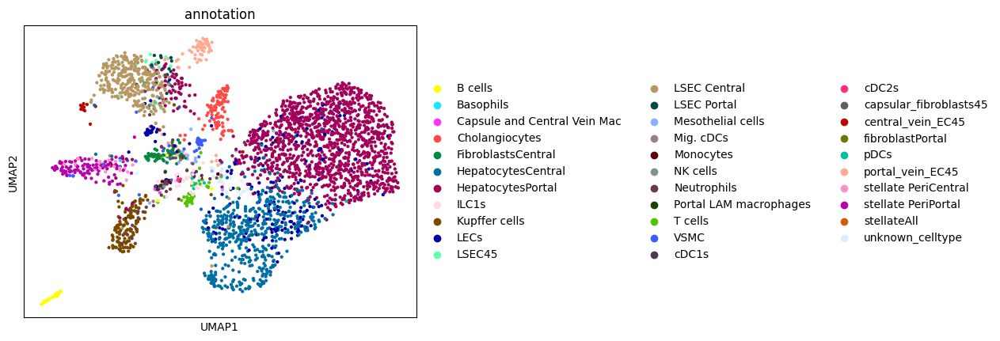

2024-07-19 11:41:21,305 - harpy.table._annotation - INFO - annotation
HepatocytesPortal               41.805077
HepatocytesCentral              15.731746
LSEC Central                     9.714823
LECs                             6.581009
Kupffer cells                    3.791915
stellate PeriPortal              3.509872
Cholangiocytes                   2.945785
portal_vein_EC45                 1.974303
FibroblastsCentral               1.629583
Neutrophils                      1.410216
VSMC                             1.378878
T cells                          1.378878
B cells                          1.128173
stellate PeriCentral             1.128173
ILC1s                            0.846130
unknown_celltype                 0.814792
Mesothelial cells                0.720777
LSEC Portal                      0.626763
LSEC45                           0.532748
central_vein_EC45                0.501410
Monocytes                        0.313381
cDC1s                            0.282043
fibrob

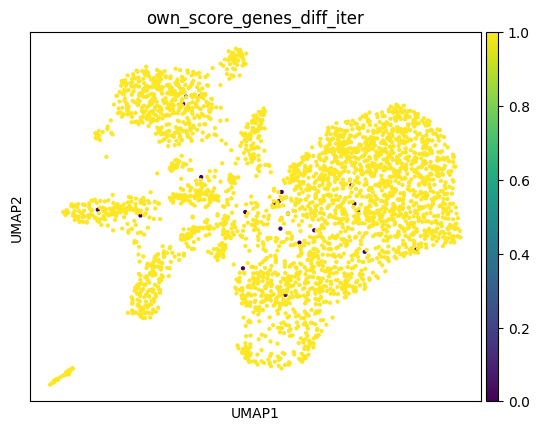

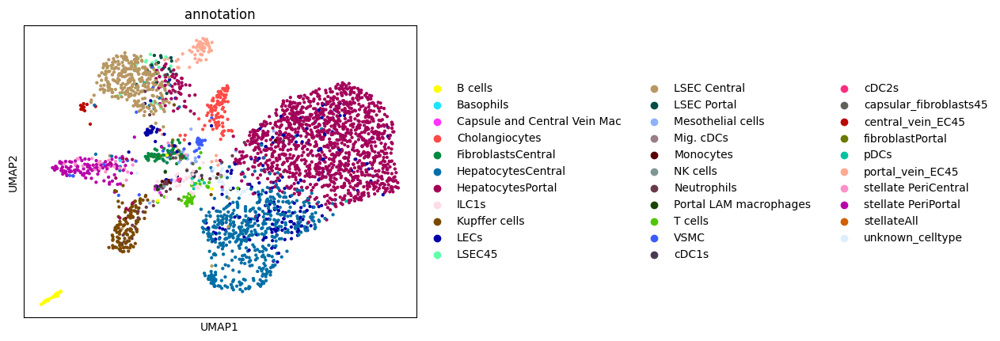

2024-07-19 11:41:21,751 - harpy.table._annotation - INFO - annotation
HepatocytesPortal               42.212473
HepatocytesCentral              15.919774
LSEC Central                     9.652147
LECs                             6.236290
Kupffer cells                    3.791915
stellate PeriPortal              3.478533
Cholangiocytes                   2.945785
portal_vein_EC45                 1.974303
FibroblastsCentral               1.629583
Neutrophils                      1.378878
VSMC                             1.378878
T cells                          1.378878
B cells                          1.128173
stellate PeriCentral             1.128173
ILC1s                            0.814792
unknown_celltype                 0.720777
Mesothelial cells                0.720777
LSEC Portal                      0.626763
LSEC45                           0.532748
central_vein_EC45                0.470072
Monocytes                        0.313381
cDC1s                            0.282043
fibrob

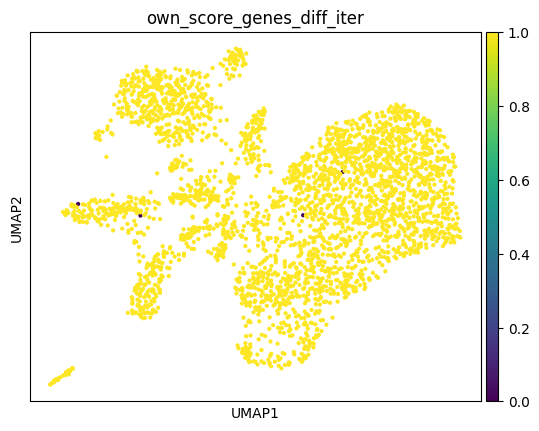

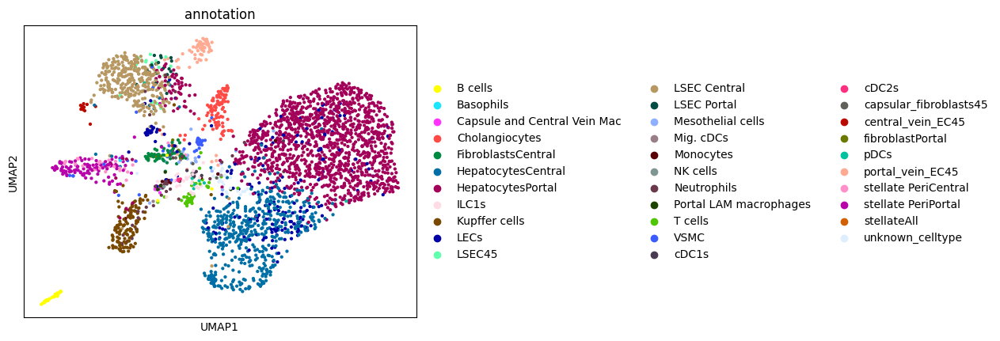

2024-07-19 11:41:22,201 - harpy.table._annotation - INFO - annotation
HepatocytesPortal               42.275149
HepatocytesCentral              15.825760
LSEC Central                     9.652147
LECs                             6.236290
Kupffer cells                    3.791915
stellate PeriPortal              3.447195
Cholangiocytes                   2.945785
portal_vein_EC45                 1.974303
FibroblastsCentral               1.629583
Neutrophils                      1.378878
VSMC                             1.378878
T cells                          1.378878
stellate PeriCentral             1.190849
B cells                          1.128173
ILC1s                            0.814792
unknown_celltype                 0.720777
Mesothelial cells                0.720777
LSEC Portal                      0.626763
LSEC45                           0.532748
central_vein_EC45                0.470072
Monocytes                        0.313381
cDC1s                            0.282043
fibrob

In [28]:
path_mg = registry.fetch( "transcriptomics/resolve/mouse/markerGeneListMartinNoLow.csv" )

sdata, celltypes_scored, celltypes_all = hp.tb.score_genes_iter(
    sdata,
    labels_layer="segmentation_mask",
    table_layer="table_transcriptomics_clustered",
    output_layer="table_transcriptomics_score_genes_iter",
    path_marker_genes=path_mg,
    overwrite=True,
    )


In [29]:
sdata.tables[ "table_transcriptomics_score_genes_iter"  ]

AnnData object with n_obs × n_vars = 3191 × 98
    obs: 'cell_ID', 'fov_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes', 'pct_counts_in_top_5_genes', 'n_counts', 'shapeSize', 'leiden', 'Cleanliness', 'annotation', 'portal_vein_EC45', 'LSEC45', 'LSEC Portal', 'LSEC Central', 'central_vein_EC45', 'stellateAll', 'stellate PeriPortal', 'stellate PeriCentral', 'FibroblastAll', 'fibroblastPortal', 'FibroblastsCentral', 'VSMC', 'capsular_fibroblasts45', 'Mesothelial cells', 'Hepatocytes', 'HepatocytesPortal', 'HepatocytesCentral', 'Cholangiocytes', 'cDC2s', 'Mig. cDCs', 'Neutrophils', 'Basophils', 'NK cells', 'ILC1s', 'T cells', 'pDCs', 'B cells', 'cDC1s', 'Kupffer cells', 'Capsule and Central Vein Mac', 'Portal LAM macrophages', 'Monocytes', 'LECs'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'mean', 'std'
    uns: 'leiden',

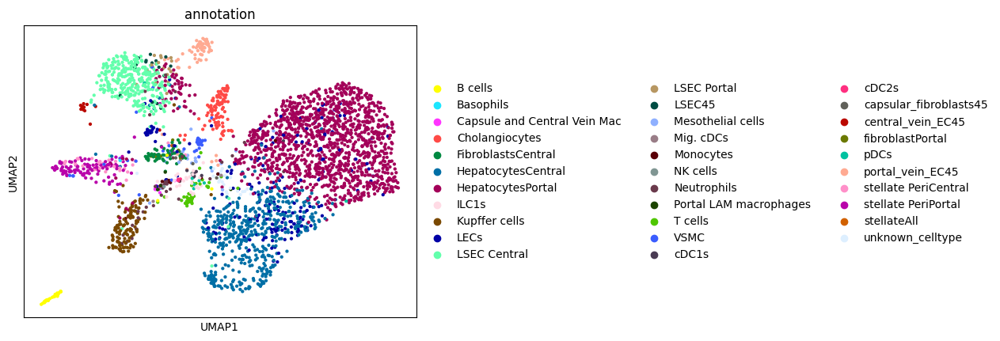

In [30]:
from harpy.utils._keys import _ANNOTATION_KEY

import scanpy as sc

sc.pl.umap(sdata.tables[ "table_transcriptomics_score_genes_iter" ], color=_ANNOTATION_KEY)

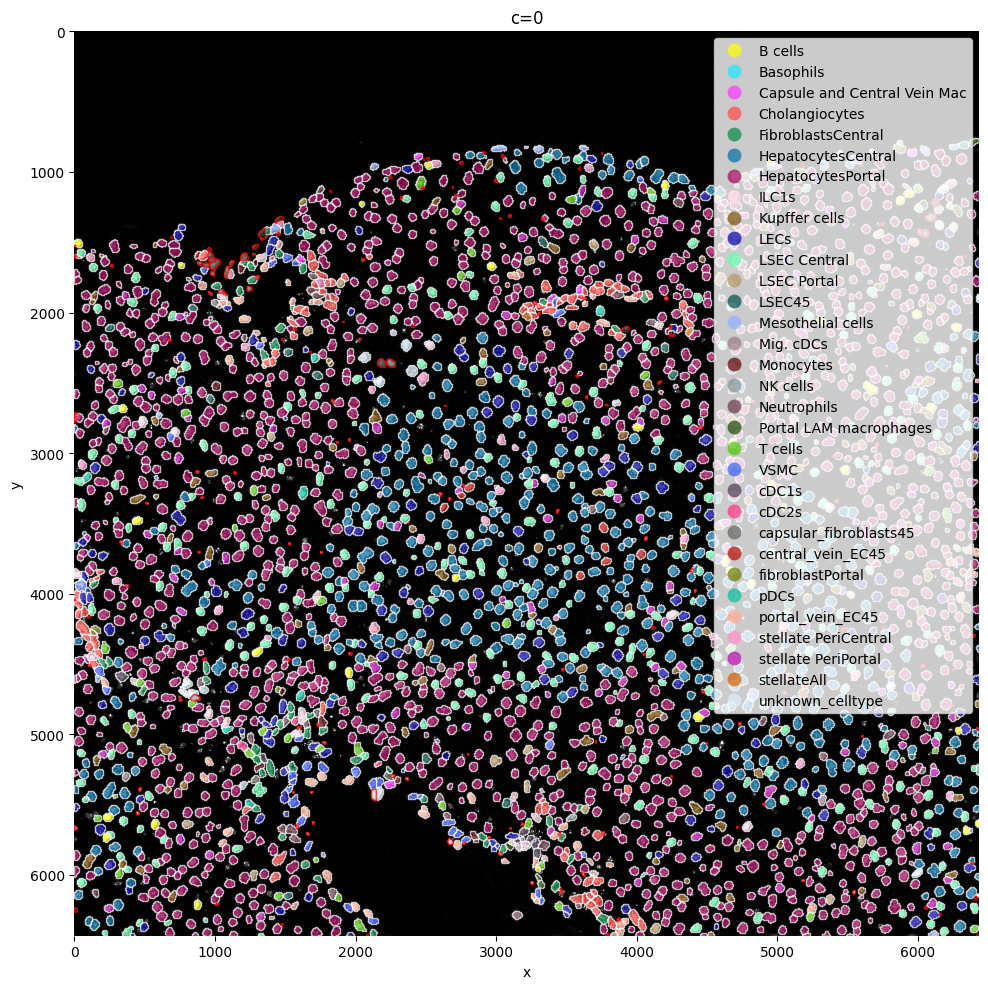

In [31]:
filtered_layers = [
    "filtered_segmentation_segmentation_mask_boundaries",
    "filtered_low_counts_segmentation_mask_boundaries",
    "filtered_size_segmentation_mask_boundaries",
]

hp.pl.plot_shapes(
    sdata,
    column=_ANNOTATION_KEY,
    img_layer="clahe",
    table_layer= "table_transcriptomics_score_genes_iter",
    shapes_layer="segmentation_mask_boundaries",
    alpha=0.7,
    shapes_layer_filtered=filtered_layers,
)

Funcitonality from squidpy can be easily used from within Harpy, just run it on sdata.table.
We impemented the neighborhood enrichment from scratch.

In [32]:
sdata = hp.tb.nhood_enrichment(
    sdata,
    labels_layer="segmentation_mask",
    table_layer="table_transcriptomics_score_genes_iter",
    output_layer="table_transcriptomics_score_genes_enrichemnt",
    overwrite=True,
    )

100%|██████████| 1000/1000 [00:06<00:00, 153.21/s]


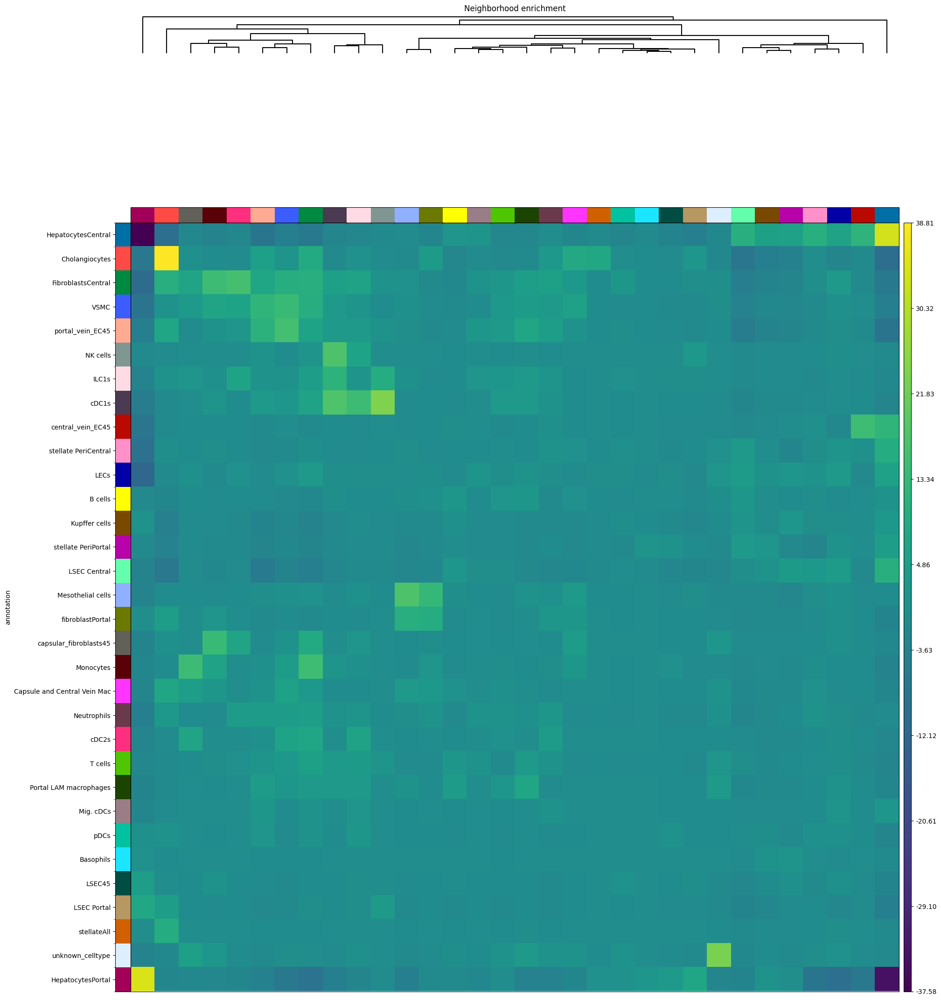

In [33]:
hp.pl.nhood_enrichment(sdata, table_layer="table_transcriptomics_score_genes_enrichemnt", celltype_column=_ANNOTATION_KEY)

Use squidpy to see the enrichement between the different celltypes.
For more info, see squidpy!